In [1]:
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
from scipy import stats 
from math import ceil
from datetime import datetime
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder
from pandas_profiling import ProfileReport

sns.set()


# Reading the Data

In [2]:
donors = pd.read_csv('donors.csv', low_memory=False)
donors = donors.set_index('Unnamed: 0')
donors.index.name = None
donors

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,RECINHSE,...,AVGGIFT,CONTROLN,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
0,2009-01-01,GRI,0,IL,61081,,,1957-12-01,0,,...,7.741935,95515,0,L,4,E,X,X,X,C
1,2014-01-01,BOA,1,CA,91326,,,1972-02-01,0,,...,15.666667,148535,0,L,2,G,X,X,X,A
2,2010-01-01,AMH,1,NC,27017,,,NaN,0,,...,7.481481,15078,1,L,4,E,X,X,X,C
3,2007-01-01,BRY,0,CA,95953,,,1948-01-01,0,,...,6.812500,172556,1,L,4,E,X,X,X,C
4,2006-01-01,,0,FL,33176,,,1940-01-01,0,X,...,6.864865,7112,1,L,2,F,X,X,X,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95407,2016-01-01,ASE,1,AK,99504,,,NaN,0,,...,25.000000,184568,0,L,1,G,X,X,X,C
95408,2016-01-01,DCD,1,TX,77379,,,1970-01-01,0,,...,20.000000,122706,1,L,1,F,X,X,X,A
95409,2015-01-01,MBC,1,MI,48910,,,1958-01-01,0,,...,8.285714,189641,1,L,3,E,X,X,X,B
95410,2006-01-01,PRV,0,CA,91320,,,1960-05-01,0,X,...,12.146341,4693,1,L,4,F,X,X,X,A


In [3]:
# donors.to_excel('donors.xlsx', index = False) 

# Initial Analysis

In [4]:
# profile = ProfileReport(donors.sample(n=10000), minimal=True)

# # saving the report as an output.html file

# profile.to_file("output.html")

In [5]:
donors.head()

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,RECINHSE,...,AVGGIFT,CONTROLN,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
0,2009-01-01,GRI,0,IL,61081,,,1957-12-01,0,,...,7.741935,95515,0,L,4,E,X,X,X,C
1,2014-01-01,BOA,1,CA,91326,,,1972-02-01,0,,...,15.666667,148535,0,L,2,G,X,X,X,A
2,2010-01-01,AMH,1,NC,27017,,,NaN,0,,...,7.481481,15078,1,L,4,E,X,X,X,C
3,2007-01-01,BRY,0,CA,95953,,,1948-01-01,0,,...,6.812500,172556,1,L,4,E,X,X,X,C
4,2006-01-01,,0,FL,33176,,,1940-01-01,0,X,...,6.864865,7112,1,L,2,F,X,X,X,A


In [6]:
donors.dtypes

ODATEDW     object
OSOURCE     object
TCODE        int64
STATE       object
ZIP         object
             ...  
RFA_2A      object
MDMAUD_R    object
MDMAUD_F    object
MDMAUD_A    object
GEOCODE2    object
Length: 475, dtype: object

In [7]:
donors.describe().T 

,count,mean,std,min,25%,50%,75%,max
TCODE,95412.0,54.223117,953.844476,0.000000,0.000000,1.000000,2.000000,72002.0
NUMCHLD,12386.0,1.527773,0.806861,1.000000,1.000000,1.000000,2.000000,7.0
INCOME,74126.0,3.886248,1.854960,1.000000,2.000000,4.000000,5.000000,7.0
WEALTH1,50680.0,5.345699,2.742490,0.000000,3.000000,6.000000,8.000000,9.0
HIT,95412.0,3.321438,9.306899,0.000000,0.000000,0.000000,3.000000,241.0
...,...,...,...,...,...,...,...,...
TIMELAG,85439.0,8.093739,8.213242,0.000000,4.000000,6.000000,11.000000,1088.0
AVGGIFT,95412.0,13.347786,10.769997,1.285714,8.384615,11.636364,15.477955,1000.0
CONTROLN,95412.0,95778.176959,55284.596094,1.000000,47910.750000,95681.500000,143643.500000,191779.0
HPHONE_D,95412.0,0.500618,0.500002,0.000000,0.000000,1.000000,1.000000,1.0


# Removing Missing Values

In [8]:
column_mv = donors.columns[donors.isnull().any()] # creating a variable that will contain the name of the columns that have missing values
column_mv = list(column_mv)

lst = []
for i in column_mv:
    perct = donors[i].isnull().sum()/len(donors[i])*100
    lst.append(perct)

lst

d = dict(zip(column_mv, lst)) # percentage of missing values for each column that contains missing values

d = dict(sorted(d.items(), key=lambda x: x[1], reverse=True)) # to have the percentages in descending order
d

{'RDATE_5': 99.99056722424852,
 'RAMNT_5': 99.99056722424852,
 'RDATE_3': 99.7463631409047,
 'RAMNT_3': 99.7463631409047,
 'RDATE_4': 99.70548777931498,
 'RAMNT_4': 99.70548777931498,
 'RDATE_6': 99.1866851129837,
 'RAMNT_6': 99.1866851129837,
 'RDATE_15': 92.38879805475202,
 'RAMNT_15': 92.38879805475202,
 'RDATE_23': 91.76309059657066,
 'RAMNT_23': 91.76309059657066,
 'RDATE_20': 91.73269609692701,
 'RAMNT_20': 91.73269609692701,
 'RDATE_7': 90.67727329895611,
 'RAMNT_7': 90.67727329895611,
 'RDATE_17': 90.14694168448413,
 'RAMNT_17': 90.14694168448413,
 'RDATE_21': 90.02955603068796,
 'RAMNT_21': 90.02955603068796,
 'RDATE_10': 89.03597031819896,
 'RAMNT_10': 89.03597031819896,
 'RDATE_13': 87.1609441160441,
 'RAMNT_13': 87.1609441160441,
 'NUMCHLD': 87.01840439357733,
 'RDATE_11': 84.55120949146858,
 'RAMNT_11': 84.55120949146858,
 'RDATE_19': 83.35953548819855,
 'RAMNT_19': 83.35953548819855,
 'RDATE_9': 82.46132561941894,
 'RAMNT_9': 82.46132561941894,
 'RDATE_24': 81.40904708003

In [9]:
d = dict((k, v) for k, v in d.items() if v >= 50) # obtaining the columns that have at least 50% of missing values
d

{'RDATE_5': 99.99056722424852,
 'RAMNT_5': 99.99056722424852,
 'RDATE_3': 99.7463631409047,
 'RAMNT_3': 99.7463631409047,
 'RDATE_4': 99.70548777931498,
 'RAMNT_4': 99.70548777931498,
 'RDATE_6': 99.1866851129837,
 'RAMNT_6': 99.1866851129837,
 'RDATE_15': 92.38879805475202,
 'RAMNT_15': 92.38879805475202,
 'RDATE_23': 91.76309059657066,
 'RAMNT_23': 91.76309059657066,
 'RDATE_20': 91.73269609692701,
 'RAMNT_20': 91.73269609692701,
 'RDATE_7': 90.67727329895611,
 'RAMNT_7': 90.67727329895611,
 'RDATE_17': 90.14694168448413,
 'RAMNT_17': 90.14694168448413,
 'RDATE_21': 90.02955603068796,
 'RAMNT_21': 90.02955603068796,
 'RDATE_10': 89.03597031819896,
 'RAMNT_10': 89.03597031819896,
 'RDATE_13': 87.1609441160441,
 'RAMNT_13': 87.1609441160441,
 'NUMCHLD': 87.01840439357733,
 'RDATE_11': 84.55120949146858,
 'RAMNT_11': 84.55120949146858,
 'RDATE_19': 83.35953548819855,
 'RAMNT_19': 83.35953548819855,
 'RDATE_9': 82.46132561941894,
 'RAMNT_9': 82.46132561941894,
 'RDATE_24': 81.40904708003

In [10]:
variables_names = d.keys() # getting the names of the variables to discard
variables_names

dict_keys(['RDATE_5', 'RAMNT_5', 'RDATE_3', 'RAMNT_3', 'RDATE_4', 'RAMNT_4', 'RDATE_6', 'RAMNT_6', 'RDATE_15', 'RAMNT_15', 'RDATE_23', 'RAMNT_23', 'RDATE_20', 'RAMNT_20', 'RDATE_7', 'RAMNT_7', 'RDATE_17', 'RAMNT_17', 'RDATE_21', 'RAMNT_21', 'RDATE_10', 'RAMNT_10', 'RDATE_13', 'RAMNT_13', 'NUMCHLD', 'RDATE_11', 'RAMNT_11', 'RDATE_19', 'RAMNT_19', 'RDATE_9', 'RAMNT_9', 'RDATE_24', 'RAMNT_24', 'RDATE_18', 'RAMNT_18', 'RDATE_22', 'RAMNT_22', 'RDATE_8', 'RAMNT_8', 'RDATE_14', 'RAMNT_14', 'RDATE_12', 'RAMNT_12', 'RDATE_16', 'RAMNT_16', 'ADATE_15', 'ADATE_23', 'MBCOLECT', 'MBCRAFT', 'MBGARDEN', 'MBBOOKS', 'MAGFAML', 'MAGFEM', 'MAGMALE', 'PUBGARDN', 'PUBCULIN', 'PUBHLTH', 'PUBDOITY', 'PUBNEWFN', 'PUBPHOTO', 'PUBOPP', 'ADATE_20'])

In [11]:
# based on the % of missig values and the meaning of the variables, we decide to discard the following varibales :

donors.drop(columns=variables_names, inplace= True)
donors

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,RECINHSE,...,AVGGIFT,CONTROLN,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
0,2009-01-01,GRI,0,IL,61081,,,1957-12-01,0,,...,7.741935,95515,0,L,4,E,X,X,X,C
1,2014-01-01,BOA,1,CA,91326,,,1972-02-01,0,,...,15.666667,148535,0,L,2,G,X,X,X,A
2,2010-01-01,AMH,1,NC,27017,,,NaN,0,,...,7.481481,15078,1,L,4,E,X,X,X,C
3,2007-01-01,BRY,0,CA,95953,,,1948-01-01,0,,...,6.812500,172556,1,L,4,E,X,X,X,C
4,2006-01-01,,0,FL,33176,,,1940-01-01,0,X,...,6.864865,7112,1,L,2,F,X,X,X,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95407,2016-01-01,ASE,1,AK,99504,,,NaN,0,,...,25.000000,184568,0,L,1,G,X,X,X,C
95408,2016-01-01,DCD,1,TX,77379,,,1970-01-01,0,,...,20.000000,122706,1,L,1,F,X,X,X,A
95409,2015-01-01,MBC,1,MI,48910,,,1958-01-01,0,,...,8.285714,189641,1,L,3,E,X,X,X,B
95410,2006-01-01,PRV,0,CA,91320,,,1960-05-01,0,X,...,12.146341,4693,1,L,4,F,X,X,X,A


In [12]:
cols = donors.columns 

num_cols = donors._get_numeric_data().columns # to get the numeric columns
list(set(cols) - set(num_cols)) # finding out the categorical columns


['RFA_10',
 'RFA_19',
 'SOLP3',
 'NOEXCH',
 'MDMAUD',
 'RFA_2R',
 'RFA_21',
 'KIDSTUFF',
 'ADATE_12',
 'ADATE_5',
 'RFA_7',
 'ADATE_24',
 'CHILD07',
 'ADATE_7',
 'CRAFTS',
 'GARDENIN',
 'MAILCODE',
 'ADATE_10',
 'HOMEOWNR',
 'RFA_3',
 'VETERANS',
 'ADATE_13',
 'MDMAUD_F',
 'CATLG',
 'RFA_9',
 'RFA_6',
 'ZIP',
 'PEPSTRFL',
 'RFA_15',
 'PHOTO',
 'WALKER',
 'MINRDATE',
 'PVASTATE',
 'NEXTDATE',
 'RFA_11',
 'RFA_16',
 'RFA_2A',
 'CHILD03',
 'RFA_13',
 'RFA_20',
 'ADATE_2',
 'RECPGVG',
 'PCOWNERS',
 'CHILD12',
 'ADATE_19',
 'DATASRCE',
 'MDMAUD_R',
 'OSOURCE',
 'STEREO',
 'COLLECT1',
 'LIFESRC',
 'ADATE_4',
 'ADATE_18',
 'ADATE_16',
 'RFA_5',
 'ADATE_9',
 'ADATE_21',
 'ADATE_6',
 'FISTDATE',
 'RFA_8',
 'PETS',
 'MAJOR',
 'CARDS',
 'MAXRDATE',
 'FISHER',
 'ADATE_11',
 'RECSWEEP',
 'PLATES',
 'ADATE_22',
 'SOLIH',
 'RFA_23',
 'ADATE_3',
 'GEOCODE2',
 'MAXADATE',
 'ODATEDW',
 'RECINHSE',
 'ADATE_8',
 'DOB',
 'RECP3',
 'BIBLE',
 'RFA_14',
 'RFA_2',
 'RFA_18',
 'RFA_4',
 'GEOCODE',
 'BOATS',
 'R

In [13]:
# https://www.ttested.com/removing-zero-variance-columns/
# https://www.kdnuggets.com/2015/05/7-methods-data-dimensionality-reduction.html
# https://machinelearningmastery.com/basic-data-cleaning-for-machine-learning/

columns_var = list(donors.var()) # seeing the variance of each column

In [14]:
columns_names = list(donors.var().index)
columns_names

['TCODE',
 'INCOME',
 'WEALTH1',
 'HIT',
 'MALEMILI',
 'MALEVET',
 'VIETVETS',
 'WWIIVETS',
 'LOCALGOV',
 'STATEGOV',
 'FEDGOV',
 'WEALTH2',
 'POP901',
 'POP902',
 'POP903',
 'POP90C1',
 'POP90C2',
 'POP90C3',
 'POP90C4',
 'POP90C5',
 'ETH1',
 'ETH2',
 'ETH3',
 'ETH4',
 'ETH5',
 'ETH6',
 'ETH7',
 'ETH8',
 'ETH9',
 'ETH10',
 'ETH11',
 'ETH12',
 'ETH13',
 'ETH14',
 'ETH15',
 'ETH16',
 'AGE901',
 'AGE902',
 'AGE903',
 'AGE904',
 'AGE905',
 'AGE906',
 'AGE907',
 'CHIL1',
 'CHIL2',
 'CHIL3',
 'AGEC1',
 'AGEC2',
 'AGEC3',
 'AGEC4',
 'AGEC5',
 'AGEC6',
 'AGEC7',
 'CHILC1',
 'CHILC2',
 'CHILC3',
 'CHILC4',
 'CHILC5',
 'HHAGE1',
 'HHAGE2',
 'HHAGE3',
 'HHN1',
 'HHN2',
 'HHN3',
 'HHN4',
 'HHN5',
 'HHN6',
 'MARR1',
 'MARR2',
 'MARR3',
 'MARR4',
 'HHP1',
 'HHP2',
 'DW1',
 'DW2',
 'DW3',
 'DW4',
 'DW5',
 'DW6',
 'DW7',
 'DW8',
 'DW9',
 'HV1',
 'HV2',
 'HV3',
 'HV4',
 'HU1',
 'HU2',
 'HU3',
 'HU4',
 'HU5',
 'HHD1',
 'HHD2',
 'HHD3',
 'HHD4',
 'HHD5',
 'HHD6',
 'HHD7',
 'HHD8',
 'HHD9',
 'HHD10',
 'H

In [15]:
def create_dict(keys, values): # creating a dictionary with the variance of each column
    return dict(zip(keys, values + [None] * (len(keys) - len(values))))

columns = create_dict(columns_names, columns_var)
columns

{'TCODE': 909819.2840686861,
 'INCOME': 3.4408747513868603,
 'WEALTH1': 7.521248688277151,
 'HIT': 86.61836509030931,
 'MALEMILI': 25.65951618329298,
 'MALEVET': 131.57361154160955,
 'VIETVETS': 227.94210070072944,
 'WWIIVETS': 313.6109817376459,
 'LOCALGOV': 19.287020899400435,
 'STATEGOV': 26.282215284858786,
 'FEDGOV': 17.265422787235952,
 'WEALTH2': 7.855457007336339,
 'POP901': 32984544.567467954,
 'POP902': 2126065.625467013,
 'POP903': 4507537.651949014,
 'POP90C1': 2249.678298156833,
 'POP90C2': 974.8181415804087,
 'POP90C3': 1603.0297953968272,
 'POP90C4': 30.975673304468177,
 'POP90C5': 33.27398880335181,
 'ETH1': 441.58294362175894,
 'ETH2': 278.58183677000665,
 'ETH3': 12.036171788099843,
 'ETH4': 49.981497060642525,
 'ETH5': 190.05547899305813,
 'ETH6': 0.46141453565491125,
 'ETH7': 4.9825664775647,
 'ETH8': 6.419855930862941,
 'ETH9': 5.332427403861326,
 'ETH10': 1.0070716912318383,
 'ETH11': 1.1111710399372703,
 'ETH12': 1.3681312506128334,
 'ETH13': 128.44899975254043,


# Remove Columns That Have A Low Variance

In [16]:
# If the variance is too low, it means that it does not change much and hence it can be ignored

low_var = dict((k, v) for k, v in columns.items() if v < 1) # obtaining / getting the columns that have variance < 1
low_var   

{'ETH6': 0.46141453565491125,
 'TPE6': 0.5398683316909378,
 'TPE7': 0.48373672466246587,
 'OCC6': 0.9900397334120534,
 'ANC5': 0.5005661250581213,
 'ANC6': 0.2841849904612681,
 'ANC11': 0.7505513156811249,
 'ANC13': 0.9552719961070043,
 'ANC15': 0.15063354956767072,
 'HC15': 0.24366676568864604,
 'MHUC2': 0.7514615411535371,
 'HPHONE_D': 0.2500022378564083}

In [17]:
variables_names2 = low_var.keys() # getting the names of the variables to discard
variables_names2

dict_keys(['ETH6', 'TPE6', 'TPE7', 'OCC6', 'ANC5', 'ANC6', 'ANC11', 'ANC13', 'ANC15', 'HC15', 'MHUC2', 'HPHONE_D'])

In [18]:
donors.drop(columns=variables_names2, inplace= True)
donors

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,RECINHSE,...,TIMELAG,AVGGIFT,CONTROLN,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
0,2009-01-01,GRI,0,IL,61081,,,1957-12-01,0,,...,4.0,7.741935,95515,L,4,E,X,X,X,C
1,2014-01-01,BOA,1,CA,91326,,,1972-02-01,0,,...,18.0,15.666667,148535,L,2,G,X,X,X,A
2,2010-01-01,AMH,1,NC,27017,,,NaN,0,,...,12.0,7.481481,15078,L,4,E,X,X,X,C
3,2007-01-01,BRY,0,CA,95953,,,1948-01-01,0,,...,9.0,6.812500,172556,L,4,E,X,X,X,C
4,2006-01-01,,0,FL,33176,,,1940-01-01,0,X,...,14.0,6.864865,7112,L,2,F,X,X,X,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95407,2016-01-01,ASE,1,AK,99504,,,NaN,0,,...,NaN,25.000000,184568,L,1,G,X,X,X,C
95408,2016-01-01,DCD,1,TX,77379,,,1970-01-01,0,,...,NaN,20.000000,122706,L,1,F,X,X,X,A
95409,2015-01-01,MBC,1,MI,48910,,,1958-01-01,0,,...,3.0,8.285714,189641,L,3,E,X,X,X,B
95410,2006-01-01,PRV,0,CA,91320,,,1960-05-01,0,X,...,4.0,12.146341,4693,L,4,F,X,X,X,A



## Remove Columns That Contain a Single Value

In [19]:
# get number of unique values for each column using numpy
counts = list(donors.nunique())
names = list(donors.nunique().index)

columns = create_dict(names, counts)

# record columns to delete
to_del = dict((k, v) for k, v in columns.items() if v == 1) 
to_del

 

{'ADATE_5': 1, 'RFA_2R': 1}

In [20]:
variables_names3 = to_del.keys() # getting the names of the variables to discard
donors.drop(columns=variables_names3, inplace= True)
donors

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,RECINHSE,...,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
0,2009-01-01,GRI,0,IL,61081,,,1957-12-01,0,,...,2010-03-01,4.0,7.741935,95515,4,E,X,X,X,C
1,2014-01-01,BOA,1,CA,91326,,,1972-02-01,0,,...,2015-04-01,18.0,15.666667,148535,2,G,X,X,X,A
2,2010-01-01,AMH,1,NC,27017,,,NaN,0,,...,2011-01-01,12.0,7.481481,15078,4,E,X,X,X,C
3,2007-01-01,BRY,0,CA,95953,,,1948-01-01,0,,...,2007-11-01,9.0,6.812500,172556,4,E,X,X,X,C
4,2006-01-01,,0,FL,33176,,,1940-01-01,0,X,...,2000-05-01,14.0,6.864865,7112,2,F,X,X,X,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95407,2016-01-01,ASE,1,AK,99504,,,NaN,0,,...,NaN,NaN,25.000000,184568,1,G,X,X,X,C
95408,2016-01-01,DCD,1,TX,77379,,,1970-01-01,0,,...,NaN,NaN,20.000000,122706,1,F,X,X,X,A
95409,2015-01-01,MBC,1,MI,48910,,,1958-01-01,0,,...,2015-01-01,3.0,8.285714,189641,3,E,X,X,X,B
95410,2006-01-01,PRV,0,CA,91320,,,1960-05-01,0,X,...,2007-04-01,4.0,12.146341,4693,4,F,X,X,X,A


## Fill missing values (Data imputation)

In [21]:
list(donors.columns[donors.isnull().any()]) # columns that remain and still have missing values

['DOB',
 'INCOME',
 'WEALTH1',
 'WEALTH2',
 'MSA',
 'ADI',
 'DMA',
 'ADATE_3',
 'ADATE_4',
 'ADATE_6',
 'ADATE_7',
 'ADATE_8',
 'ADATE_9',
 'ADATE_10',
 'ADATE_11',
 'ADATE_12',
 'ADATE_13',
 'ADATE_14',
 'ADATE_16',
 'ADATE_17',
 'ADATE_18',
 'ADATE_19',
 'ADATE_21',
 'ADATE_22',
 'ADATE_24',
 'FISTDATE',
 'NEXTDATE',
 'TIMELAG',
 'GEOCODE2']

In [22]:
cateogry_columns=donors.select_dtypes(include=['object']).columns.tolist()
integer_columns=donors.select_dtypes(include=['int64','float64']).columns.tolist()

for column in donors:
    if donors[column].isnull().any():
        if(column in cateogry_columns):
            donors[column]=donors[column].fillna(donors[column].mode()[0])
        else:
            donors[column]=donors[column].fillna(donors[column].mean)
            


## Metric Variables' Correlation Matrix

In [23]:
# https://campus.datacamp.com/courses/dimensionality-reduction-in-python/feature-selection-i-selecting-for-feature-information?ex=13

corr_df = donors.corr().abs() # create positive correlation matrix
corr_df.style.background_gradient(cmap='coolwarm')

In [24]:
# para ver as variaveis com alta correlção, e elimina-las
# kot = corr_df[corr_df>=.9]
# plt.figure(figsize=(12,8))
# sns.heatmap(kot, cmap="Greens")

In [25]:
corr_df.unstack().sort_values().drop_duplicates()

EIC14     HUPA1     0.000002
ANC4      VC1       0.000004
MAXRAMNT  ANC1      0.000005
ETH10     OEDC4     0.000009
LASTGIFT  TCODE     0.000010
                      ...   
POP901    POP902    0.988491
ETH2      ETHC5     0.989670
HV2       HV1       0.993412
HHAGE1    HHAGE3    0.993997
TCODE     TCODE     1.000000
Length: 43072, dtype: float64

In [26]:
corr_matrix = donors.corr()

In [27]:
mask = np.triu(np.ones_like(corr_df, dtype=bool))
tri_df = corr_matrix.mask(mask)
tri_df

,TCODE,HIT,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,POP901,...,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MAXRAMNT,LASTGIFT,AVGGIFT,CONTROLN,RFA_2F
TCODE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HIT,-0.002897,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MALEMILI,0.004019,-0.007942,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MALEVET,-0.003282,0.054985,-0.008677,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
VIETVETS,-0.007315,-0.007429,0.102373,0.098238,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MAXRAMNT,0.001127,-0.002322,-0.004428,-0.023799,-0.018611,-0.015304,-0.016003,-0.013912,-0.011767,0.008331,...,0.142544,0.557428,-0.043655,-0.067850,0.293249,NaN,NaN,NaN,NaN,NaN
LASTGIFT,-0.000010,-0.007213,-0.002587,-0.020013,-0.008483,-0.015640,-0.015366,-0.012089,-0.008013,0.009049,...,0.097370,0.323751,-0.181368,-0.190158,0.531548,0.562620,NaN,NaN,NaN,NaN
AVGGIFT,-0.005778,-0.014705,0.003128,-0.028783,-0.005370,-0.026297,-0.018537,-0.017977,-0.004882,0.016790,...,0.088357,0.365560,-0.256992,-0.268607,0.754563,0.766810,0.784187,NaN,NaN,NaN
CONTROLN,-0.001920,0.000420,0.015047,0.015943,0.067545,-0.026777,0.076983,0.010900,0.075260,-0.016623,...,-0.313830,-0.101719,-0.129263,-0.081800,0.040790,-0.011947,-0.000427,0.011507,NaN,NaN


In [28]:
# Find index of feature columns with correlation greater than 0.90
to_drop = [column for column in tri_df.columns if any(tri_df[column] > 0.90)]
print(to_drop) # to get the high correlated attributes and removed them


['POP901', 'POP902', 'ETH2', 'ETH5', 'AGE901', 'AGE902', 'AGE903', 'AGE904', 'AGE905', 'AGE907', 'AGEC6', 'AGEC7', 'HHAGE1', 'HHAGE3', 'HHN1', 'HHN3', 'HHN4', 'HHN5', 'MARR1', 'HHP1', 'HHP2', 'DW1', 'DW4', 'DW5', 'DW6', 'HV1', 'HV2', 'HV3', 'HV4', 'HHD1', 'HHD2', 'HHD7', 'ETHC4', 'HVP1', 'HVP3', 'HUR2', 'RHP1', 'RP1', 'IC1', 'IC2', 'IC3', 'IC10', 'IC11', 'IC12', 'IC13', 'IC14', 'TPE3', 'LFC1', 'LFC2', 'LFC3', 'OCC9', 'AFC1', 'AFC4', 'CARDPROM', 'NGIFTALL']


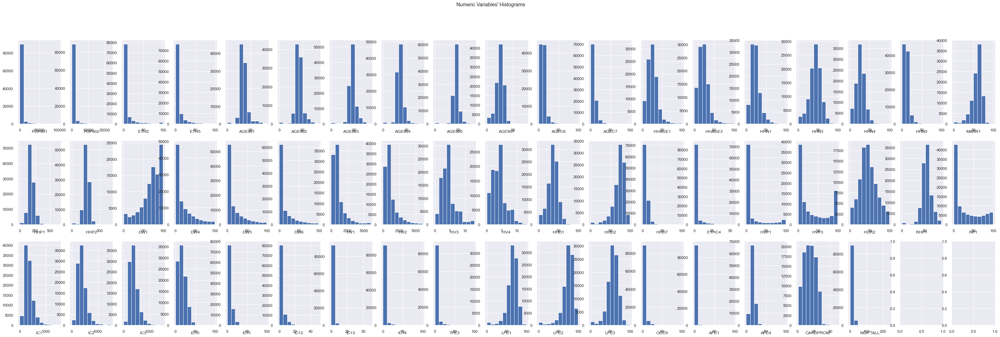

In [30]:
sns.set()

fig, axes = plt.subplots(3, ceil(len(to_drop) / 3), figsize=(50, 15))
for ax, feat in zip(axes.flatten(), to_drop): 
    ax.hist(donors[feat])
    ax.set_title(feat, y=-0.13)
    
title =  "Numeric Variables' Histograms"

plt.suptitle(title)

plt.show()

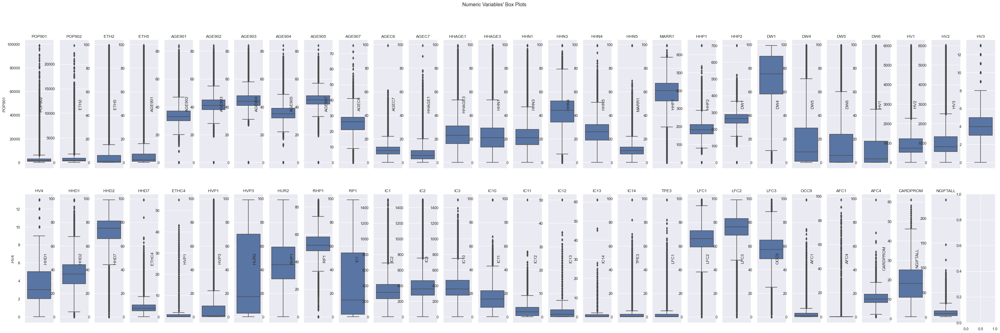

In [31]:
sns.set()

fig, axes = plt.subplots(2, ceil(len(to_drop) / 2), figsize=(50, 15))

for ax, feat in zip(axes.flatten(), to_drop): 
    sns.boxplot(y=donors[feat], ax=ax)
    ax.set_title(feat)
    
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()

In [33]:
# following the criteria and the graphics we decide to drop the following columns/ features

to_drop_final = ['POP901', 'POP902','HHD7','HVP1','IC11', 'IC12', 'IC13','RP1','IC14','OCC9', 'AFC1', 'AFC4','NGIFTALL']
donors.drop(donors[to_drop_final], axis=1, inplace= True) # reduced dataframe


In [34]:
corr_matrix = donors.corr() 
corr_df = donors.corr().abs()

mask = np.triu(np.ones_like(corr_df, dtype=bool))
tri_df = corr_matrix.mask(mask)
tri_df

,TCODE,HIT,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,POP903,...,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MAXRAMNT,LASTGIFT,AVGGIFT,CONTROLN,RFA_2F
TCODE,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HIT,-0.002897,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MALEMILI,0.004019,-0.007942,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MALEVET,-0.003282,0.054985,-0.008677,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
VIETVETS,-0.007315,-0.007429,0.102373,0.098238,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MAXRAMNT,0.001127,-0.002322,-0.004428,-0.023799,-0.018611,-0.015304,-0.016003,-0.013912,-0.011767,0.010340,...,0.057910,0.142544,0.557428,-0.067850,0.293249,NaN,NaN,NaN,NaN,NaN
LASTGIFT,-0.000010,-0.007213,-0.002587,-0.020013,-0.008483,-0.015640,-0.015366,-0.012089,-0.008013,0.010420,...,0.030767,0.097370,0.323751,-0.190158,0.531548,0.562620,NaN,NaN,NaN,NaN
AVGGIFT,-0.005778,-0.014705,0.003128,-0.028783,-0.005370,-0.026297,-0.018537,-0.017977,-0.004882,0.018230,...,-0.013944,0.088357,0.365560,-0.268607,0.754563,0.766810,0.784187,NaN,NaN,NaN
CONTROLN,-0.001920,0.000420,0.015047,0.015943,0.067545,-0.026777,0.076983,0.010900,0.075260,-0.025733,...,-0.137348,-0.313830,-0.101719,-0.081800,0.040790,-0.011947,-0.000427,0.011507,NaN,NaN


In [35]:
# Find index of feature columns with correlation less than 0.15
to_drop2 =  [column for column in tri_df.columns if any(tri_df[column] < 0.15)]
print(to_drop2) # to get attribuetes that have vety little correlation and discard them

['TCODE', 'HIT', 'MALEMILI', 'MALEVET', 'VIETVETS', 'WWIIVETS', 'LOCALGOV', 'STATEGOV', 'FEDGOV', 'POP903', 'POP90C1', 'POP90C2', 'POP90C3', 'POP90C4', 'POP90C5', 'ETH1', 'ETH2', 'ETH3', 'ETH4', 'ETH5', 'ETH7', 'ETH8', 'ETH9', 'ETH10', 'ETH11', 'ETH12', 'ETH13', 'ETH14', 'ETH15', 'ETH16', 'AGE901', 'AGE902', 'AGE903', 'AGE904', 'AGE905', 'AGE906', 'AGE907', 'CHIL1', 'CHIL2', 'CHIL3', 'AGEC1', 'AGEC2', 'AGEC3', 'AGEC4', 'AGEC5', 'AGEC6', 'AGEC7', 'CHILC1', 'CHILC2', 'CHILC3', 'CHILC4', 'CHILC5', 'HHAGE1', 'HHAGE2', 'HHAGE3', 'HHN1', 'HHN2', 'HHN3', 'HHN4', 'HHN5', 'HHN6', 'MARR1', 'MARR2', 'MARR3', 'MARR4', 'HHP1', 'HHP2', 'DW1', 'DW2', 'DW3', 'DW4', 'DW5', 'DW6', 'DW7', 'DW8', 'DW9', 'HV1', 'HV2', 'HV3', 'HV4', 'HU1', 'HU2', 'HU3', 'HU4', 'HU5', 'HHD1', 'HHD2', 'HHD3', 'HHD4', 'HHD5', 'HHD6', 'HHD8', 'HHD9', 'HHD10', 'HHD11', 'HHD12', 'ETHC1', 'ETHC2', 'ETHC3', 'ETHC4', 'ETHC5', 'ETHC6', 'HVP2', 'HVP3', 'HVP4', 'HVP5', 'HVP6', 'HUR1', 'HUR2', 'RHP1', 'RHP2', 'RHP3', 'RHP4', 'HUPA1', 'H

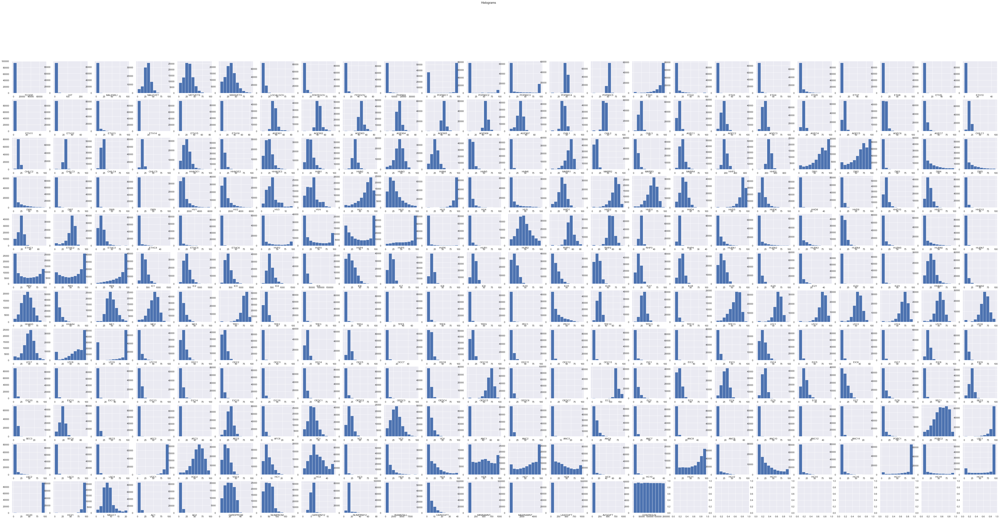

In [36]:
sns.set()

fig, axes = plt.subplots(12, ceil(len(to_drop2) / 12), figsize=(85, 40))
for ax, feat in zip(axes.flatten(), to_drop2): 
    ax.hist(donors[feat])
    ax.set_title(feat, y=-0.13)
    
title = "Histograms"

plt.suptitle(title)

plt.show()

In [39]:
# following the criteria/filter and the graphics analysis we decide to drop the following columns/ features

# to_drop_final2 = donors.drop(donors[to_drop_final2], axis=1, inplace= True)
